<a href="https://colab.research.google.com/github/lmoroney/dlaicourse/blob/master/Course%202%20-%20Part%206%20-%20Lesson%203%20-%20Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Copyright 2019 The TensorFlow Authors.

In [0]:
#@title Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

In [1]:
!wget --no-check-certificate \
    https://storage.googleapis.com/mledu-datasets/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5 \
    -O inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5

'wget' is not recognized as an internal or external command,
operable program or batch file.


In [1]:
import os

from tensorflow.keras import layers
from tensorflow.keras import Model

  
from tensorflow.keras.applications.inception_v3 import InceptionV3

local_weights_file = '/tmp/inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'
local_weights_file = 'C:\gits_folders\Tensorflow_Lite_embeded\generic_transfer learning\inception_v3_weights_tf_dim_ordering_tf_kernels_notop.h5'

pre_trained_model = InceptionV3(input_shape = (150, 150, 3), 
                                include_top = False, 
                                weights = None)

pre_trained_model.load_weights(local_weights_file)

for layer in pre_trained_model.layers:
  layer.trainable = False
  
# pre_trained_model.summary()

last_layer = pre_trained_model.get_layer('mixed7')
print('last layer output shape: ', last_layer.output_shape)
last_output = last_layer.output

last layer output shape:  (None, 7, 7, 768)


In [2]:
pre_trained_model.summary()

Model: "inception_v3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 74, 74, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 74, 74, 32)   0           batch_normalization[0][0]        
_______________________________________________________________________________________

In [3]:
last_output

<tf.Tensor 'mixed7/Identity:0' shape=(None, 7, 7, 768) dtype=float32>

In [4]:
from tensorflow.keras.optimizers import RMSprop

# Flatten the output layer to 1 dimension
x = layers.Flatten()(last_output)
# Add a fully connected layer with 1,024 hidden units and ReLU activation
x = layers.Dense(1024, activation='relu')(x)
# Add a dropout rate of 0.2
x = layers.Dropout(0.2)(x)                  
# Add a final sigmoid layer for classification
x = layers.Dense  (1, activation='sigmoid')(x)           

model = Model( pre_trained_model.input, x) 

model.compile(optimizer = RMSprop(lr=0.0001), 
              loss = 'binary_crossentropy', 
              metrics = ['accuracy'])


In [5]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 150, 150, 3) 0                                            
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 74, 74, 32)   864         input_1[0][0]                    
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 74, 74, 32)   96          conv2d[0][0]                     
__________________________________________________________________________________________________
activation (Activation)         (None, 74, 74, 32)   0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [6]:
#!wget --no-check-certificate \
#        https://storage.googleapis.com/mledu-datasets/cats_and_dogs_filtered.zip \
#       -O /tmp/cats_and_dogs_filtered.zip

from tensorflow.keras.preprocessing.image import ImageDataGenerator

import os
import zipfile

local_zip = 'C:\gits_folders\Tensorflow_Lite_embeded\generic_transfer learning\cats_and_dogs_filtered.zip'

zip_ref = zipfile.ZipFile(local_zip, 'r')

zip_ref.extractall('.')
zip_ref.close()

# Define our example directories and files
base_dir = 'cats_and_dogs_filtered'

train_dir = os.path.join( base_dir, 'train')
validation_dir = os.path.join( base_dir, 'validation')


train_cats_dir = os.path.join(train_dir, 'cats') # Directory with our training cat pictures
train_dogs_dir = os.path.join(train_dir, 'dogs') # Directory with our training dog pictures
validation_cats_dir = os.path.join(validation_dir, 'cats') # Directory with our validation cat pictures
validation_dogs_dir = os.path.join(validation_dir, 'dogs')# Directory with our validation dog pictures

train_cat_fnames = os.listdir(train_cats_dir)
train_dog_fnames = os.listdir(train_dogs_dir)

# Add our data-augmentation parameters to ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255.,
                                   rotation_range = 40,
                                   width_shift_range = 0.2,
                                   height_shift_range = 0.2,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True)

# Note that the validation data should not be augmented!
test_datagen = ImageDataGenerator( rescale = 1.0/255. )

# Flow training images in batches of 20 using train_datagen generator
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    batch_size = 20,
                                                    class_mode = 'binary', 
                                                    target_size = (150, 150))     

# Flow validation images in batches of 20 using test_datagen generator
validation_generator =  test_datagen.flow_from_directory( validation_dir,
                                                          batch_size  = 20,
                                                          class_mode  = 'binary', 
                                                          target_size = (150, 150))

Found 2000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [10]:
history = model.fit(
            train_generator,
            validation_data = validation_generator,
            steps_per_epoch = 100,
            epochs = 20,
            validation_steps = 50,
            verbose = 2)

Train for 100 steps, validate for 50 steps
Epoch 1/20
100/100 - 25s - loss: 0.2344 - accuracy: 0.9110 - val_loss: 0.4650 - val_accuracy: 0.9490
Epoch 2/20
100/100 - 24s - loss: 0.2547 - accuracy: 0.8995 - val_loss: 0.5352 - val_accuracy: 0.9440
Epoch 3/20
100/100 - 18s - loss: 0.2344 - accuracy: 0.9010 - val_loss: 0.5193 - val_accuracy: 0.9510
Epoch 4/20
100/100 - 19s - loss: 0.2346 - accuracy: 0.9085 - val_loss: 0.3280 - val_accuracy: 0.9690
Epoch 5/20
100/100 - 18s - loss: 0.2326 - accuracy: 0.8995 - val_loss: 0.3476 - val_accuracy: 0.9670
Epoch 6/20
100/100 - 17s - loss: 0.2414 - accuracy: 0.9145 - val_loss: 0.3718 - val_accuracy: 0.9600
Epoch 7/20
100/100 - 17s - loss: 0.2481 - accuracy: 0.9075 - val_loss: 0.3744 - val_accuracy: 0.9600
Epoch 8/20
100/100 - 17s - loss: 0.2245 - accuracy: 0.9135 - val_loss: 0.5238 - val_accuracy: 0.9520
Epoch 9/20
100/100 - 18s - loss: 0.2030 - accuracy: 0.9215 - val_loss: 0.4234 - val_accuracy: 0.9620
Epoch 10/20
100/100 - 18s - loss: 0.2143 - accur

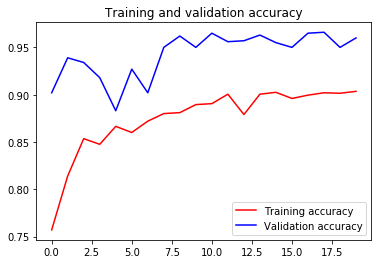

<Figure size 432x288 with 0 Axes>

In [9]:
import matplotlib.pyplot as plt
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(len(acc))

plt.plot(epochs, acc, 'r', label='Training accuracy')
plt.plot(epochs, val_acc, 'b', label='Validation accuracy')
plt.title('Training and validation accuracy')
plt.legend(loc=0)
plt.figure()


plt.show()

In [11]:
import PIL

In [12]:
image_batch, label_batch = next(iter(train_generator))

In [13]:
label_batch

array([1., 0., 0., 1., 1., 1., 1., 0., 0., 1., 1., 1., 0., 0., 1., 1., 0.,
       0., 1., 1.], dtype=float32)

In [14]:
image_batch[0]

array([[[0.34117204, 0.46176085, 0.2833328 ],
        [0.35671696, 0.47536266, 0.2852759 ],
        [0.3684839 , 0.48707548, 0.28438553],
        ...,
        [0.3554261 , 0.42869347, 0.26439527],
        [0.34428895, 0.43191743, 0.28425175],
        [0.3660091 , 0.46386045, 0.3208171 ]],

       [[0.3389529 , 0.46333128, 0.29921156],
        [0.33506668, 0.45750195, 0.28755286],
        [0.34194508, 0.46243724, 0.2834294 ],
        ...,
        [0.340789  , 0.4213749 , 0.26622492],
        [0.35160753, 0.44472492, 0.30254814],
        [0.37881657, 0.4803272 , 0.33545423]],

       [[0.34920987, 0.4827335 , 0.31927136],
        [0.3433805 , 0.4710748 , 0.30955577],
        [0.33875963, 0.4630414 , 0.29863176],
        ...,
        [0.34280646, 0.42932305, 0.2805455 ],
        [0.36341473, 0.46052483, 0.3178521 ],
        [0.3868104 , 0.49358484, 0.37897334]],

       ...,

       [[0.39021575, 0.50067985, 0.16316557],
        [0.4530029 , 0.56280684, 0.22185375],
        [0.3961291 , 0

In [15]:
import numpy as np
import numpy
import os
import PIL
import PIL.Image
import matplotlib.pyplot as plt

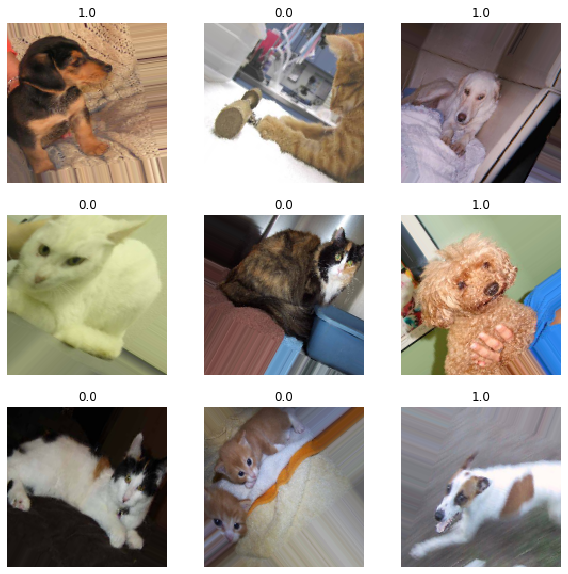

In [16]:
image_batch, label_batch = next(iter(train_generator))
plt.figure(figsize=(10, 10))
for i in range(9):
  ax = plt.subplot(3, 3, i + 1)
  plt.imshow(image_batch[i])#.numpy().astype("uint8"))
  label = label_batch[i]
  plt.title(label)
  plt.axis("off")

In [17]:
from tensorflow import keras
import tensorflow as tf



In [18]:
cat="dog.2002.jpg"
#cat='cat.2048.jpg'
cat="xander4.jpg"
#sunflower_path = tf.keras.utils.get_file('Red_sunflower', origin=sunflower_url)

img = keras.preprocessing.image.load_img(
    cat, target_size=(150, 150)
)
img_array = keras.preprocessing.image.img_to_array(img)

img_array = np.array(img_array).astype('float32')/255 #extra line

img_array = tf.expand_dims(img_array, 0) # Create a batch

predictions = model.predict(img_array)
#score = tf.nn.softmax(predictions[0])

print( "This image most likely belongs to {}".format(predictions[0,0] ))

This image most likely belongs to 0.0


In [19]:
predictions[0,0]

0.0

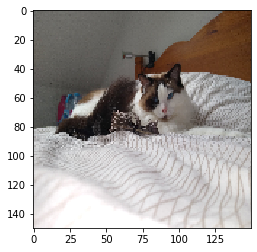

In [20]:
plt.imshow(img)

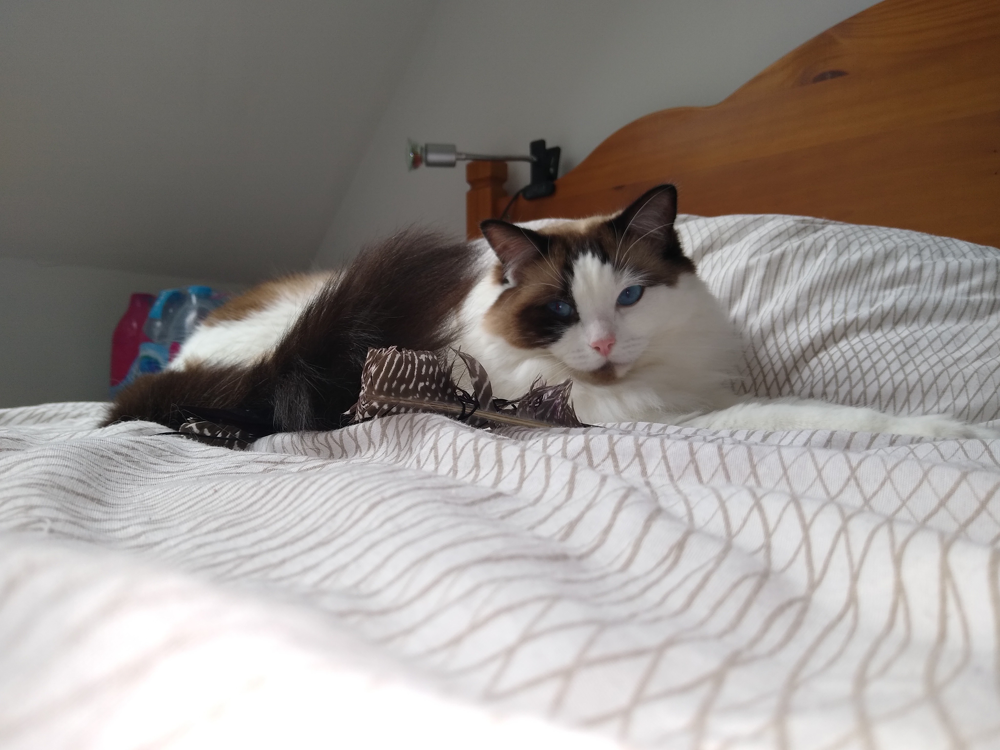

In [21]:
PIL.Image.open(cat)

## Generate a SavedModel

In [22]:
export_dir = 'saved_model'
tf.saved_model.save(model, export_dir)

Instructions for updating:
If using Keras pass *_constraint arguments to layers.
INFO:tensorflow:Assets written to: saved_model\assets


In [23]:
loaded = tf.saved_model.load(export_dir)

In [24]:
loaded

<tensorflow.python.saved_model.load.Loader._recreate_base_user_object.<locals>._UserObject at 0x26d79ed1b38>

In [25]:
print(list(loaded.signatures.keys()))
infer = loaded.signatures["serving_default"]
print(infer.structured_input_signature)
print(infer.structured_outputs)

['serving_default']
((), {'input_1': TensorSpec(shape=(None, 150, 150, 3), dtype=tf.float32, name='input_1')})
{'dense_1': TensorSpec(shape=(None, 1), dtype=tf.float32, name='dense_1')}


In [26]:
converter = tf.lite.TFLiteConverter.from_saved_model(export_dir)
tflite_model = converter.convert()

In [28]:
#tflite_model = converter.convert()
tflite_model_file = 'converted_model.tflite'

with open(tflite_model_file, "wb") as f:
    f.write(tflite_model)

In [30]:
!dir *.tflite

 Volume in drive C is Windows-SSD
 Volume Serial Number is 36BC-8C76

 Directory of C:\gits_folders\deeplearning.ai\tensorlite\dlaicourse

13/12/2020  17:27       190,009,980 converted_model.tflite
               1 File(s)    190,009,980 bytes
               0 Dir(s)  171,446,800,384 bytes free


### Initialize the TFLite Interpreter To Try It

In [35]:
interpreter = tf.lite.Interpreter(model_path=tflite_model_file)
interpreter.allocate_tensors()

input_index = interpreter.get_input_details()[0]["index"]
output_index = interpreter.get_output_details()[0]["index"]

In [36]:
input_index

234

In [37]:
output_index

0

In [50]:
cat="dog.2002.jpg"
cat='cat.2048.jpg'
#cat="xander4.jpg"
#sunflower_path = tf.keras.utils.get_file('Red_sunflower', origin=sunflower_url)

img = keras.preprocessing.image.load_img(
    cat, target_size=(150, 150)
)
img_array = keras.preprocessing.image.img_to_array(img)

img_array = np.array(img_array).astype('float32')/255 #extra line

img_array = tf.expand_dims(img_array, 0) # Create a batch

#predictions = interpreter.predict(img_array)
#score = tf.nn.softmax(predictions[0])

#print( "This image most likely belongs to {}".format(predictions[0,0] ))

In [51]:
predictions = []

test_labels, test_imgs = [], []

In [52]:
interpreter.set_tensor(input_index, img_array)
interpreter.invoke()
predictions.append(interpreter.get_tensor(output_index))

In [53]:
predictions[0][0][0]

0.0